# Logistic Regression

In [215]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.linear_model import LogisticRegression, LogisticRegressionCV

from sklearn.metrics import confusion_matrix, classification_report

df_train = pd.read_csv('ChurnData.csv')

In [216]:
del df_train['Unnamed: 0']

In [217]:
df_train.shape

(3333, 20)

In [218]:
df_train.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,KS,128,area_code_415,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,no
1,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
2,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
3,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
4,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no


In [219]:
from sklearn.preprocessing import LabelEncoder

tras = LabelEncoder()

df_train['area_code_tr'] = tras.fit_transform(df_train['area_code'])

df_train.columns

del df_train['area_code']

df_train.columns

Index(['state', 'account_length', 'international_plan', 'voice_mail_plan',
       'number_vmail_messages', 'total_day_minutes', 'total_day_calls',
       'total_day_charge', 'total_eve_minutes', 'total_eve_calls',
       'total_eve_charge', 'total_night_minutes', 'total_night_calls',
       'total_night_charge', 'total_intl_minutes', 'total_intl_calls',
       'total_intl_charge', 'number_customer_service_calls', 'churn',
       'area_code_tr'],
      dtype='object')

In [220]:
df_train['target_churn_dum'] = pd.get_dummies(df_train.churn,prefix='churn',drop_first=True)
df_train.columns
del df_train['international_plan']
del df_train['voice_mail_plan']
del df_train['churn']
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          3333 non-null   object 
 1   account_length                 3333 non-null   int64  
 2   number_vmail_messages          3333 non-null   int64  
 3   total_day_minutes              3333 non-null   float64
 4   total_day_calls                3333 non-null   int64  
 5   total_day_charge               3333 non-null   float64
 6   total_eve_minutes              3333 non-null   float64
 7   total_eve_calls                3333 non-null   int64  
 8   total_eve_charge               3333 non-null   float64
 9   total_night_minutes            3333 non-null   float64
 10  total_night_calls              3333 non-null   int64  
 11  total_night_charge             3333 non-null   float64
 12  total_intl_minutes             3333 non-null   f

In [221]:
df_train.columns

Index(['state', 'account_length', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'area_code_tr', 'target_churn_dum'],
      dtype='object')

In [222]:
from sklearn.model_selection import train_test_split

df_train.columns

X = df_train[['account_length', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'area_code_tr']]
Y = df_train['target_churn_dum']

In [223]:
xtrain,xtest,ytrain,ytest=train_test_split(X,Y,test_size=0.20,stratify=Y)
log_model = LogisticRegression()

log_model.fit(xtrain,ytrain)

print("training accuracy:", log_model.score(xtrain,ytrain)) #training accuracy

print("test accuracy:",log_model.score(xtest,ytest)) # test accuracy

training accuracy: 0.8514628657164292
test accuracy: 0.8545727136431784


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


In [224]:
# SHAP

In [225]:
np.round(log_model.coef_,2)

array([[-0.  , -0.02,  0.01, -0.01,  0.  ,  0.  , -0.01,  0.  , -0.  ,
        -0.01, -0.  , -0.  , -0.1 , -0.  ,  0.38, -0.03]])

In [226]:
log_model.intercept_

array([-0.03767936])

In [227]:
X.columns

Index(['account_length', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'area_code_tr'],
      dtype='object')

In [228]:
# Provide Probability as Output
def model_churn_proba(x):
    return log_model.predict_proba(x)[:,1]

# Provide Log Odds as Output
def model_churn_log_odds(x):
    p = log_model.predict_log_proba(x)
    return p[:,1] - p[:,0]

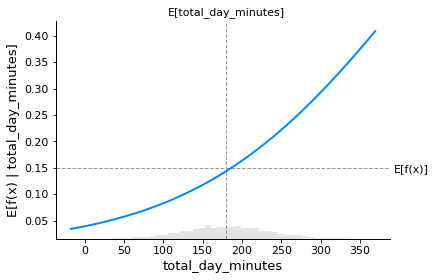

In [229]:
# make a standard partial dependence plot
sample_ind = 25
fig,ax = shap.partial_dependence_plot(
    "total_day_minutes", model_churn_proba, X, model_expected_value=True,
    feature_expected_value=True, show=False, ice=False
)

In [230]:
# compute the SHAP values for the linear model
background_churn = shap.maskers.Independent(X, max_samples=1000)
explainer = shap.Explainer(log_model, background_churn,feature_names=list(X.columns))
shap_values_churn = explainer(X)

The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, or maskers.Impute)


In [231]:
shap_values = pd.DataFrame(shap_values_churn.values)
shap_values.columns = list(X.columns)
shap_values

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,area_code_tr
0,-0.015844,-0.343937,0.723084,-0.096701,0.020536,-0.004767,0.026936,-0.000042,-0.077499,0.097995,-0.000096,0.000041,0.156689,0.000005,-0.235897,-0.000066
1,-0.003821,-0.363881,-0.130891,-0.216998,-0.003720,-0.006566,-0.023887,-0.000057,-0.094276,-0.022602,-0.000117,-0.001676,0.156689,-0.000191,-0.235897,-0.000066
2,-0.020997,0.154667,0.544038,-0.133715,0.015451,-0.076902,-0.112828,-0.000674,0.064507,-0.032651,0.000080,-0.000980,-0.039050,-0.000111,-0.619470,-0.000066
3,0.009347,0.154667,1.006093,0.264192,0.028572,-0.133039,0.166700,-0.001166,0.005179,0.118094,0.000006,0.001618,-0.234789,0.000185,0.147675,0.033053
4,0.014500,0.154667,-0.088811,-0.124462,-0.002521,-0.051248,-0.265298,-0.000449,0.022476,-0.203496,0.000028,-0.000006,0.156689,-0.000001,0.531248,-0.000066
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,-0.052485,-0.563323,-0.175446,0.208670,-0.004988,0.012367,-0.316121,0.000109,-0.136999,0.178392,-0.000170,0.000087,-0.136920,0.000011,0.147675,-0.000066
3329,0.018507,0.154667,0.442551,0.393743,0.012570,-0.046420,0.585993,-0.000407,0.014865,-0.223596,0.000018,0.000226,0.058820,0.000026,0.531248,-0.000066
3330,0.041408,0.154667,0.027528,-0.087447,0.000787,0.081757,0.547875,0.000717,0.013828,0.097995,0.000017,-0.001861,-0.136920,-0.000213,0.147675,-0.033185
3331,-0.047905,0.154667,0.299810,-0.050432,0.008518,-0.040551,0.217524,-0.000355,0.104981,-0.364291,0.000130,0.002361,-0.528398,0.000269,0.147675,-0.033185


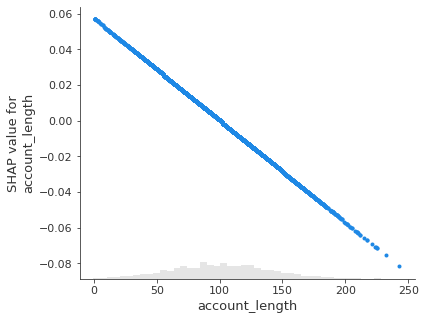

In [232]:
shap.plots.scatter(shap_values_churn[:,'account_length'])

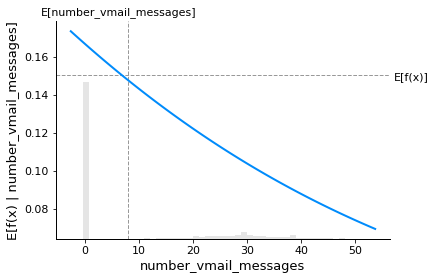

In [233]:
# make a standard partial dependence plot
sample_ind = 25
fig,ax = shap.partial_dependence_plot(
    "number_vmail_messages", model_churn_proba, X, model_expected_value=True,
    feature_expected_value=True, show=False, ice=False
)

In [234]:
shap_values_churn.feature_names

['account_length',
 'number_vmail_messages',
 'total_day_minutes',
 'total_day_calls',
 'total_day_charge',
 'total_eve_minutes',
 'total_eve_calls',
 'total_eve_charge',
 'total_night_minutes',
 'total_night_calls',
 'total_night_charge',
 'total_intl_minutes',
 'total_intl_calls',
 'total_intl_charge',
 'number_customer_service_calls',
 'area_code_tr']

In [235]:
# compute the SHAP values for the linear model
explainer_log_odds = shap.Explainer(log_model, background_churn,feature_names=list(X.columns))
shap_values_churn_log_odds = explainer_log_odds(X)
shap_values_churn_log_odds

The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, or maskers.Impute)


.values =
array([[-1.58439830e-02, -3.43936960e-01,  7.23084407e-01, ...,
         4.73901220e-06, -2.35897099e-01, -6.62384928e-05],
       [-3.82101403e-03, -3.63881115e-01, -1.30890899e-01, ...,
        -1.91007051e-04, -2.35897099e-01, -6.62384928e-05],
       [-2.09966839e-02,  1.54666925e-01,  5.44038376e-01, ...,
        -1.10751165e-04, -6.19469618e-01, -6.62384928e-05],
       ...,
       [ 4.14082501e-02,  1.54666925e-01,  2.75277083e-02, ...,
        -2.12539118e-04,  1.47675420e-01, -3.31854849e-02],
       [-4.79052335e-02,  1.54666925e-01,  2.99809690e-01, ...,
         2.68996198e-04,  1.47675420e-01, -3.31854849e-02],
       [ 1.50722229e-02, -3.43936960e-01,  4.69779654e-01, ...,
        -1.91007051e-04, -6.19469618e-01, -6.62384928e-05]])

.base_values =
array([-1.9844468, -1.9844468, -1.9844468, ..., -1.9844468, -1.9844468,
       -1.9844468])

.data =
array([[128.  ,  25.  , 265.1 , ...,   2.7 ,   1.  ,   1.  ],
       [107.  ,  26.  , 161.6 , ...,   3.7 ,   1.  ,  

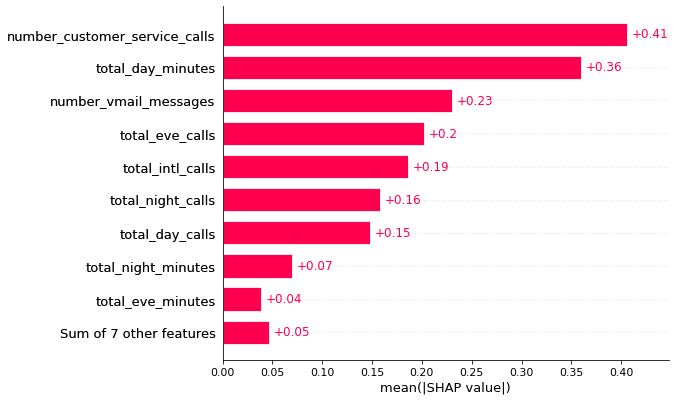

In [236]:
shap.plots.bar(shap_values_churn_log_odds)

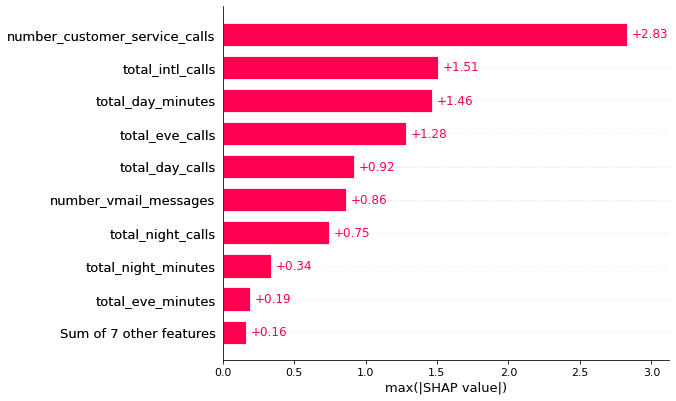

In [237]:
shap.plots.bar(shap_values_churn_log_odds.abs.max(0))

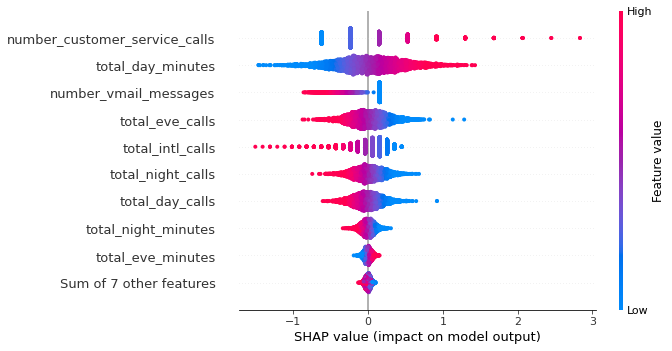

In [238]:
shap.plots.beeswarm(shap_values_churn_log_odds)

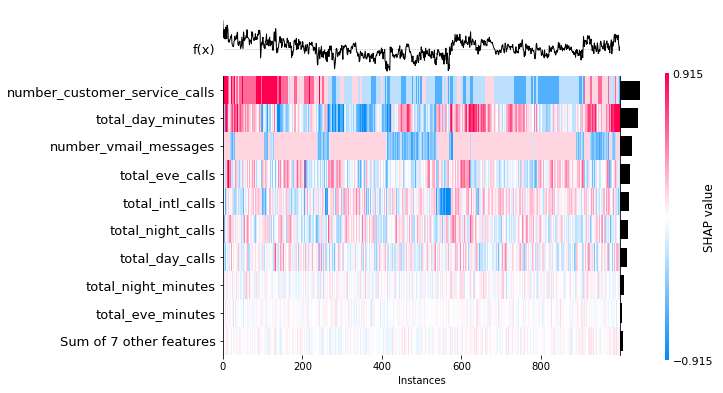

In [239]:
shap.plots.heatmap(shap_values_churn_log_odds[:1000])

In [240]:
temp_df = pd.DataFrame()
temp_df['Feature Name'] = pd.Series(X.columns)
temp_df['Coefficients'] = pd.Series(log_model.coef_.flatten())
temp_df.sort_values(by='Coefficients',ascending=False)

,Feature Name,Coefficients
14,number_customer_service_calls,0.383573
2,total_day_minutes,0.008251
4,total_day_charge,0.001378
5,total_eve_minutes,0.000947
7,total_eve_charge,0.000098
10,total_night_charge,-0.000048
13,total_intl_charge,-0.000196
11,total_intl_minutes,-0.000464
0,account_length,-0.000573
8,total_night_minutes,-0.001730


In [241]:
# LIME

In [242]:
import lime
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(np.array(xtrain),
                    feature_names=list(xtrain.columns), 
                    class_names=['target_churn_dum'], 
                    verbose=True, mode='classification')

In [243]:
# this record is a no churn scenario
exp = explainer.explain_instance(xtest.iloc[0], log_model.predict_proba, num_features=16)
exp.as_list()

Intercept 0.19964542206393504
Prediction_local [0.02120321]
Right: 0.032573796725605446


[('number_customer_service_calls <= 1.00', -0.10648974718460207),
 ('total_day_minutes <= 143.70', -0.08249206933442362),
 ('number_vmail_messages <= 0.00', 0.06382660843177218),
 ('total_eve_calls > 114.00', -0.04699741115966453),
 ('101.00 < total_night_calls <= 114.00', -0.014762303967523637),
 ('total_eve_minutes > 235.07', 0.009634152789439484),
 ('account_length > 126.00', -0.007625767961201073),
 ('1.00 < area_code_tr <= 2.00', -0.007580266941264391),
 ('2.27 < total_intl_charge <= 2.75', 0.006752662155234198),
 ('87.00 < total_day_calls <= 101.00', 0.006710448915561096),
 ('166.93 < total_night_minutes <= 200.40', 0.0050459288119269275),
 ('total_day_charge <= 24.43', -0.004912905568923088),
 ('3.00 < total_intl_calls <= 4.00', 0.004284661893121922),
 ('7.51 < total_night_charge <= 9.02', -0.0018452098168102525),
 ('total_eve_charge > 19.98', -0.0018361080165251397),
 ('8.40 < total_intl_minutes <= 10.20', -0.00015488134199565526)]

In [244]:
pd.DataFrame(exp.as_list())

,0,1
0,number_customer_service_calls <= 1.00,-0.106490
1,total_day_minutes <= 143.70,-0.082492
2,number_vmail_messages <= 0.00,0.063827
3,total_eve_calls > 114.00,-0.046997
4,101.00 < total_night_calls <= 114.00,-0.014762
5,total_eve_minutes > 235.07,0.009634
6,account_length > 126.00,-0.007626
7,1.00 < area_code_tr <= 2.00,-0.007580
8,2.27 < total_intl_charge <= 2.75,0.006753
9,87.00 < total_day_calls <= 101.00,0.006710


In [245]:
exp.show_in_notebook(show_table=True)

In [246]:
# This is s churn scenario
exp = explainer.explain_instance(xtest.iloc[20], log_model.predict_proba, num_features=16)
exp.as_list()

Intercept 0.19622547549004968
Prediction_local [0.02779075]
Right: 0.05406801664197326


[('number_customer_service_calls <= 1.00', -0.1051704018591274),
 ('total_day_minutes <= 143.70', -0.08123843856317248),
 ('number_vmail_messages <= 0.00', 0.060440474273630314),
 ('total_night_calls > 114.00', -0.03772510059008749),
 ('total_night_minutes <= 166.93', 0.018961344334009887),
 ('4.00 < total_intl_calls <= 6.00', -0.01874992387896742),
 ('101.00 < total_day_calls <= 114.00', -0.012626038151287463),
 ('87.00 < total_eve_calls <= 101.00', 0.008877082326670987),
 ('total_day_charge <= 24.43', -0.006760698796115),
 ('200.95 < total_eve_minutes <= 235.07', 0.0037676968143755167),
 ('total_intl_charge <= 2.27', -0.003428077730448058),
 ('area_code_tr <= 0.00', 0.0027143144337776967),
 ('total_night_charge <= 7.51', 0.001462367516914703),
 ('17.09 < total_eve_charge <= 19.98', 0.0008777804227101248),
 ('total_intl_minutes <= 8.40', 0.0007869607238191091),
 ('73.00 < account_length <= 100.00', -0.0006240681812713856)]

In [247]:
exp.show_in_notebook(show_table=True)

In [248]:
xtest.iloc[20]

account_length                    99.00
number_vmail_messages              0.00
total_day_minutes                 95.40
total_day_calls                  105.00
total_day_charge                  16.22
total_eve_minutes                207.20
total_eve_calls                  101.00
total_eve_charge                  17.61
total_night_minutes              136.00
total_night_calls                117.00
total_night_charge                 6.12
total_intl_minutes                 5.60
total_intl_calls                   5.00
total_intl_charge                  1.51
number_customer_service_calls      1.00
area_code_tr                       0.00
Name: 1153, dtype: float64

In [249]:
ytest.iloc[20]

0

In [250]:
log_model.predict(xtest)[20]

0

In [251]:
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(xtrain),
                    feature_names=list(xtrain.columns), 
                    class_names=['target_churn_dum'], 
                    verbose=True, mode='classification')
# Code for SP-LIME
import warnings
from lime import submodular_pick

# SP-LIME returns exaplanations on a sample set to provide a non redundant global decision boundary of original model
sp_obj = submodular_pick.SubmodularPick(explainer, np.array(xtrain), 
                                        log_model.predict_proba, 
                                        num_features=14,
                                        num_exps_desired=10)

Intercept 0.8193052173738242
Prediction_local [0.95667472]
Right: 0.9566360149646208
Intercept 0.8571061843472849
Prediction_local [0.83379809]
Right: 0.8546408442005193
Intercept 0.8669284468088675
Prediction_local [0.82102811]
Right: 0.8410424001650726
Intercept 0.9347187007712439
Prediction_local [0.72442594]
Right: 0.7790169174697695
Intercept 0.7634094167128633
Prediction_local [0.9882515]
Right: 0.973777861012497
Intercept 0.8979311103131943
Prediction_local [0.84066649]
Right: 0.8583028178383626
Intercept 0.9252979321027343
Prediction_local [0.71906935]
Right: 0.733919241390117
Intercept 0.8794474943978012
Prediction_local [0.73181701]
Right: 0.8034451426870177
Intercept 0.8547627932182665
Prediction_local [0.85985368]
Right: 0.9092277916338602
Intercept 0.7235735634110462
Prediction_local [1.09536263]
Right: 0.9811580023883428
Intercept 0.8380332092375744
Prediction_local [0.87424428]
Right: 0.8807646008428556
Intercept 0.8759069539668215
Prediction_local [0.87971127]
Right: 0.

Intercept 0.9115714997817619
Prediction_local [0.75666018]
Right: 0.8425086338045003
Intercept 0.8206684467746196
Prediction_local [0.91717441]
Right: 0.9625460855959524
Intercept 0.8410432731379804
Prediction_local [0.85908437]
Right: 0.8971066396808857
Intercept 0.8885438182119293
Prediction_local [0.83577654]
Right: 0.8756532443140732
Intercept 0.804875073938064
Prediction_local [0.97453091]
Right: 0.9406840705532901
Intercept 0.8363924840001106
Prediction_local [0.89820063]
Right: 0.9275406118935428
Intercept 0.9371125988361556
Prediction_local [0.69798118]
Right: 0.7137583277722446
Intercept 0.8328469805708908
Prediction_local [0.89481898]
Right: 0.8943243707582208
Intercept 0.8847911914764499
Prediction_local [0.83861031]
Right: 0.9149893779874746
Intercept 0.8489110255075075
Prediction_local [0.87067702]
Right: 0.8062272727104116
Intercept 0.7707371542526652
Prediction_local [0.97634214]
Right: 0.9589254051858367
Intercept 0.7943197200307518
Prediction_local [0.87806166]
Right: 

Intercept 0.8395475351001354
Prediction_local [0.84999164]
Right: 0.8524143219457101
Intercept 0.9287543290011876
Prediction_local [0.74248112]
Right: 0.7303697054264214
Intercept 0.8214016011025683
Prediction_local [0.95311736]
Right: 0.9400729151705799
Intercept 0.9479792107344766
Prediction_local [0.65339541]
Right: 0.6954049697736617
Intercept 0.8083946337115514
Prediction_local [0.97762589]
Right: 0.9659696299972329
Intercept 0.9314222430225747
Prediction_local [0.72676644]
Right: 0.7953679613064242
Intercept 0.7923170169081001
Prediction_local [1.0311135]
Right: 0.9748001439937373
Intercept 0.8941739326469456
Prediction_local [0.82543804]
Right: 0.8994556942091665
Intercept 0.823860046094072
Prediction_local [0.93039998]
Right: 0.915942774397433
Intercept 0.8569884840206262
Prediction_local [0.8299222]
Right: 0.9092952960599893
Intercept 0.8525912978533915
Prediction_local [0.83131472]
Right: 0.8827392829505354
Intercept 0.856853458829415
Prediction_local [0.83209412]
Right: 0.90

Intercept 0.8125332485995289
Prediction_local [0.96664616]
Right: 0.9473227627714529
Intercept 0.8318412519906742
Prediction_local [0.88868024]
Right: 0.9149258540586939
Intercept 0.890887723448941
Prediction_local [0.85704916]
Right: 0.9083561951926237
Intercept 0.8911405956084749
Prediction_local [0.84963265]
Right: 0.8630696998259164
Intercept 0.926295834909328
Prediction_local [0.73480504]
Right: 0.8206547890760275
Intercept 0.8810929699876253
Prediction_local [0.88734817]
Right: 0.9086822103971886
Intercept 0.83955643596695
Prediction_local [0.88554628]
Right: 0.9080340048115872
Intercept 0.9265008720103145
Prediction_local [0.72311305]
Right: 0.7699019615894539
Intercept 0.9929917577284166
Prediction_local [0.5498218]
Right: 0.5326894566226987
Intercept 0.8803141757706664
Prediction_local [0.7548389]
Right: 0.8452633752979112
Intercept 0.7629242284301232
Prediction_local [0.98240076]
Right: 0.9183646024343001
Intercept 0.8364434622129684
Prediction_local [0.87288401]
Right: 0.903

Intercept 0.890955222398015
Prediction_local [0.84092386]
Right: 0.8271562800154156
Intercept 0.8582823570510796
Prediction_local [0.81545783]
Right: 0.8999403537607761
Intercept 0.8924683825449631
Prediction_local [0.83825163]
Right: 0.8522426911393642
Intercept 0.8403458307994496
Prediction_local [0.88619015]
Right: 0.9053296903015181
Intercept 0.8005811865127299
Prediction_local [0.88402284]
Right: 0.8716294877891124
Intercept 0.8360255413023021
Prediction_local [0.90658107]
Right: 0.895024274104154
Intercept 0.8699140246112484
Prediction_local [0.91098439]
Right: 0.9158418528598088
Intercept 0.8340804793785301
Prediction_local [0.89954787]
Right: 0.9037099625289376
Intercept 0.8043872464862857
Prediction_local [0.88629902]
Right: 0.9047527885219762
Intercept 0.8965013436163506
Prediction_local [0.8371495]
Right: 0.8772776802329623
Intercept 0.8547144118195111
Prediction_local [0.84848242]
Right: 0.8500007424446501
Intercept 0.8580781086635284
Prediction_local [0.81990399]
Right: 0.

Intercept 0.8342112992329503
Prediction_local [0.90164385]
Right: 0.9296034363001441
Intercept 0.9274481126257581
Prediction_local [0.72991443]
Right: 0.7701687545851855
Intercept 0.8918485473556281
Prediction_local [0.71846943]
Right: 0.7568707252176714
Intercept 0.8264797353988598
Prediction_local [0.91201361]
Right: 0.9250266367314351
Intercept 0.828098710498393
Prediction_local [0.90131043]
Right: 0.9465324896568998
Intercept 0.8174643464099913
Prediction_local [0.84647072]
Right: 0.9089739062545502
Intercept 0.8446086095773829
Prediction_local [0.87452668]
Right: 0.8575278879835047
Intercept 0.809696024315891
Prediction_local [0.95981491]
Right: 0.9507658687094576
Intercept 0.8535863356357615
Prediction_local [0.83119298]
Right: 0.8716189198898683
Intercept 0.833885718388224
Prediction_local [0.89662373]
Right: 0.9165146164015855
Intercept 0.8296575328430662
Prediction_local [0.91344558]
Right: 0.947217869853965
Intercept 0.8837232074422969
Prediction_local [0.85850287]
Right: 0.8

Intercept 0.8476197866698048
Prediction_local [0.8429307]
Right: 0.8825498320590167
Intercept 0.8794482060311566
Prediction_local [0.7700786]
Right: 0.7787909735266665
Intercept 0.8662787872799481
Prediction_local [0.82114796]
Right: 0.8179735097819714
Intercept 0.856928606283268
Prediction_local [0.85669616]
Right: 0.8213775786940803
Intercept 0.8637266622348403
Prediction_local [0.8288524]
Right: 0.8625791604338298
Intercept 0.8409746968147175
Prediction_local [0.87664622]
Right: 0.8326310029988758
Intercept 0.8576609094344524
Prediction_local [0.84249921]
Right: 0.8499748014241223
Intercept 0.8084828399068331
Prediction_local [0.84689235]
Right: 0.8319280865301971
Intercept 0.9365563336227046
Prediction_local [0.72886866]
Right: 0.7187089201820038
Intercept 0.9054929401357799
Prediction_local [0.78794626]
Right: 0.7689754864810467
Intercept 0.8360197678099327
Prediction_local [0.90031244]
Right: 0.8857054780199718
Intercept 0.9461732054555027
Prediction_local [0.68362815]
Right: 0.6

Intercept 0.798319453275922
Prediction_local [0.88343469]
Right: 0.8998109469178929
Intercept 0.9396109676409465
Prediction_local [0.71552185]
Right: 0.6176344722552221
Intercept 0.9154032313748568
Prediction_local [0.8000216]
Right: 0.7718341455917952
Intercept 0.8170023972722921
Prediction_local [0.93171546]
Right: 0.9148313084923062
Intercept 0.840533442088116
Prediction_local [0.90545126]
Right: 0.915384631377038
Intercept 0.8620081291584504
Prediction_local [0.81843753]
Right: 0.836562469146656
Intercept 0.8251724589535763
Prediction_local [0.8987456]
Right: 0.8812742793902459
Intercept 0.8594647186489253
Prediction_local [0.83218111]
Right: 0.8406956316816765
Intercept 0.7946954619929213
Prediction_local [0.89271471]
Right: 0.9191404381088765
Intercept 0.8648237529442985
Prediction_local [0.80494902]
Right: 0.8749424542380319
Intercept 0.824122935562312
Prediction_local [0.95052364]
Right: 0.9472215477778281
Intercept 0.8087591807861847
Prediction_local [0.88177905]
Right: 0.8702

Intercept 0.8166125611159196
Prediction_local [0.83295142]
Right: 0.7870896128744589
Intercept 0.820663793458165
Prediction_local [0.92527078]
Right: 0.8974175211315131
Intercept 0.8021091767807861
Prediction_local [0.88468403]
Right: 0.948116338719176
Intercept 0.8944119588401324
Prediction_local [0.865388]
Right: 0.9075623983616178
Intercept 0.8407078413606012
Prediction_local [0.88135796]
Right: 0.9000069021239562
Intercept 0.8396510513102536
Prediction_local [0.89039165]
Right: 0.9490290069783183
Intercept 0.8461104133489649
Prediction_local [0.88296509]
Right: 0.903488839562677
Intercept 0.8478149108968241
Prediction_local [0.8344872]
Right: 0.8909620646474948
Intercept 0.8628282923337136
Prediction_local [0.8221401]
Right: 0.8756204673222129
Intercept 0.8906033879814222
Prediction_local [0.87911413]
Right: 0.8773391736738986
Intercept 0.9363157808609003
Prediction_local [0.74204183]
Right: 0.7349913112340519
Intercept 0.7395838410566815
Prediction_local [1.07127193]
Right: 0.9729

Intercept 0.8115566484294192
Prediction_local [0.96464061]
Right: 0.9483202384985223
Intercept 0.749214941472479
Prediction_local [1.03866811]
Right: 0.9717498307057412
Intercept 0.847515125670321
Prediction_local [0.84909763]
Right: 0.8845588744776168
Intercept 0.8592701136315057
Prediction_local [0.83995761]
Right: 0.852625208768645
Intercept 0.8872493039767421
Prediction_local [0.84524809]
Right: 0.8221066286631795
Intercept 0.7985361761851594
Prediction_local [1.0016716]
Right: 0.9596735569213969
Intercept 0.8415347392769668
Prediction_local [0.85119433]
Right: 0.834324774438112
Intercept 0.8076633875250567
Prediction_local [0.86370303]
Right: 0.8566766422605179
Intercept 0.8145145140380917
Prediction_local [0.94719898]
Right: 0.9403161482003807
Intercept 0.8497485707696293
Prediction_local [0.86238945]
Right: 0.9148185154870228
Intercept 0.8000661784728685
Prediction_local [0.87059524]
Right: 0.9212640677212178
Intercept 0.8086157410230738
Prediction_local [0.96241042]
Right: 0.91

Intercept 0.9212511638585839
Prediction_local [0.75236248]
Right: 0.8261574574344166
Intercept 0.8296130319270825
Prediction_local [0.77590968]
Right: 0.8994746579087405
Intercept 0.8870905361790942
Prediction_local [0.88118107]
Right: 0.887124346538178
Intercept 0.8973092908028266
Prediction_local [0.83038688]
Right: 0.8213308664907453
Intercept 0.9025502200142104
Prediction_local [0.85098682]
Right: 0.8948251632932014
Intercept 0.866941654834826
Prediction_local [0.81503254]
Right: 0.8164135506257137
Intercept 0.8197847086204907
Prediction_local [0.94640888]
Right: 0.9196790692064895
Intercept 0.754774433062688
Prediction_local [1.0311067]
Right: 0.962219409064374
Intercept 0.8154619321486674
Prediction_local [0.94598192]
Right: 0.9710106604389693
Intercept 0.7684370343649476
Prediction_local [0.98009912]
Right: 0.9640112465542612
Intercept 0.9048177648934415
Prediction_local [0.79657474]
Right: 0.8117096855709118
Intercept 0.8031558337924667
Prediction_local [0.86691936]
Right: 0.87

In [252]:
[exp.show_in_notebook() for exp in sp_obj.sp_explanations ]

[None, None, None, None, None, None, None, None, None, None]